<a href="https://colab.research.google.com/github/laxmidc423/Data-Analytics-project-on-Global-Education/blob/main/graph.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install networkx matplotlib


In [ ]:
import pandas as pd
import math
import networkx as nx
import matplotlib.pyplot as plt


In [ ]:
# Define Dijkstra's algorithm to find the shortest path
def dijkstra(graph, initial, destination):
    distances = {vertex: math.inf for vertex in graph}
    distances[initial] = 0
    previous_nodes = {}  # To reconstruct path
    visited = set()

    while True:
        nearest_vertex = min((distance, vertex) for (vertex, distance) in distances.items() if vertex not in visited)[1]
        if nearest_vertex == destination or distances[nearest_vertex] == math.inf:
            break

        visited.add(nearest_vertex)
        for vertex, distance in graph[nearest_vertex].items():
            if vertex not in visited:
                new_distance = distances[nearest_vertex] + distance
                if new_distance < distances[vertex]:
                    distances[vertex] = new_distance
                    previous_nodes[vertex] = nearest_vertex  # Track path'

                    # Reconstruct shortest path
    path = []
    current = destination
    while current in previous_nodes:
        path.insert(0, current)
        current = previous_nodes[current]
    if path:
        path.insert(0, initial)  # Add the starting node

    return distances.get(destination), path

In [5]:




!pip install pyvis


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 31.0 MB/s eta 0:00:00


Enter initial location: Nigdi
The nearest hospital from Nigdi is Sahyadri Super Speciality Hospital with a distance of 0.11 km.
Shortest path: Nigdi -> Sahyadri Super Speciality Hospital


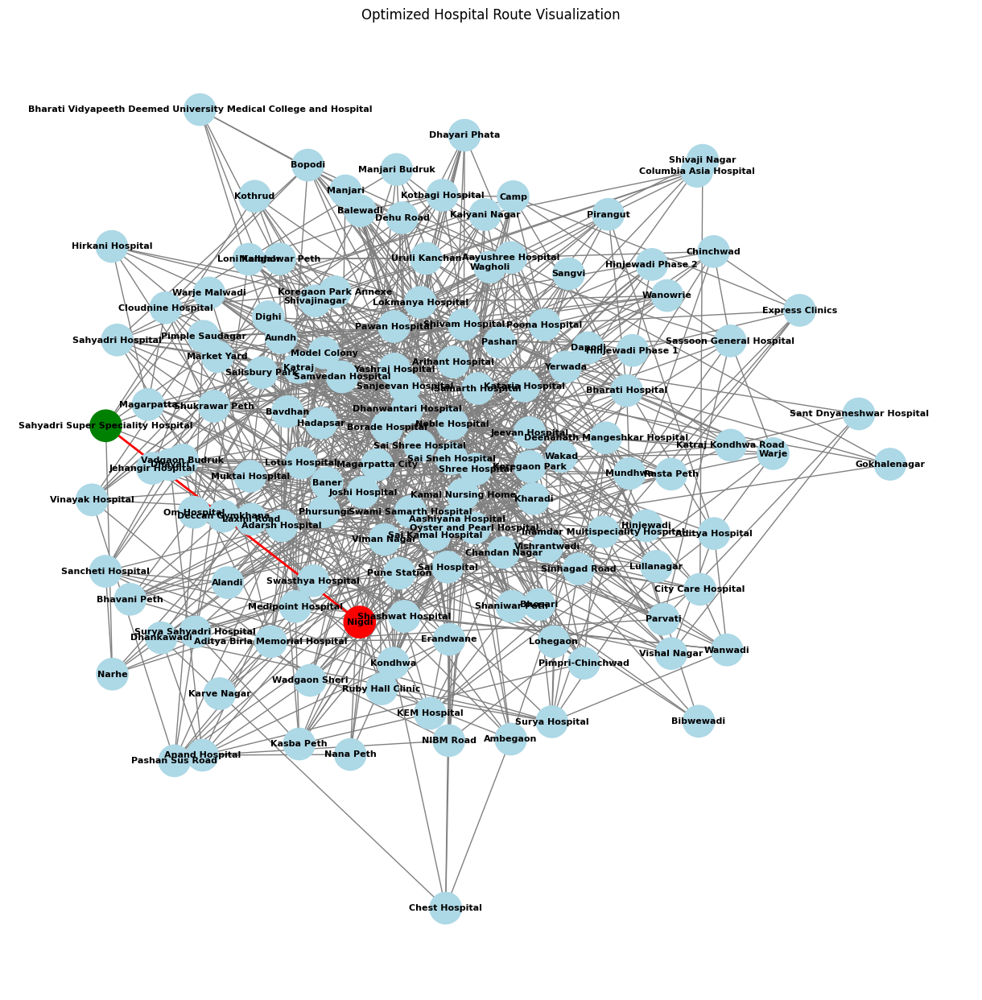

In [ ]:
def main():
    # Read the dataset
    df = pd.read_csv("Hospitals_in_Pune_dataset.csv")

    # Create graph dictionary
    graph = {}
    for index, row in df.iterrows():
        source = row["Location_of_Patient"]
        destination = row["Final_Destination_Nearest_Hospital"]
        if source not in graph:
            graph[source] = {}
        if destination not in graph:
            graph[destination] = {}
        graph[source][destination] = row["Distance_km"] / row["Traffic_Level_Percentage"]

    # User input
    initial_location = input("Enter initial location: ")

    # Validate input
    if initial_location not in graph:
        print("Entered location is not in the dataset.")
        return

        # Find nearest hospital
    nearest_destination = None
    nearest_distance = math.inf
    shortest_path = []

    for destination in graph:
        if destination == initial_location:
            continue
        distance, path = dijkstra(graph, initial_location, destination)
        if distance is not None and distance < nearest_distance:
            nearest_destination = destination
            nearest_distance = distance
            shortest_path = path

             # Display output
    if nearest_destination:
        print(f"The nearest hospital from {initial_location} is {nearest_destination} with a distance of {nearest_distance:.2f} km.")
        print(f"Shortest path: {' -> '.join(shortest_path)}")

         # Visualize graph
        visualize_graph(graph, shortest_path)
    else:
        print("No destination reachable from this location.")

if __name__ == "__main__":
    main()


🏥 Nearest Hospital: Kotbagi Hospital
📏 Distance: 0.09 km
🛤️ Shortest Path: Balewadi → Kotbagi Hospital


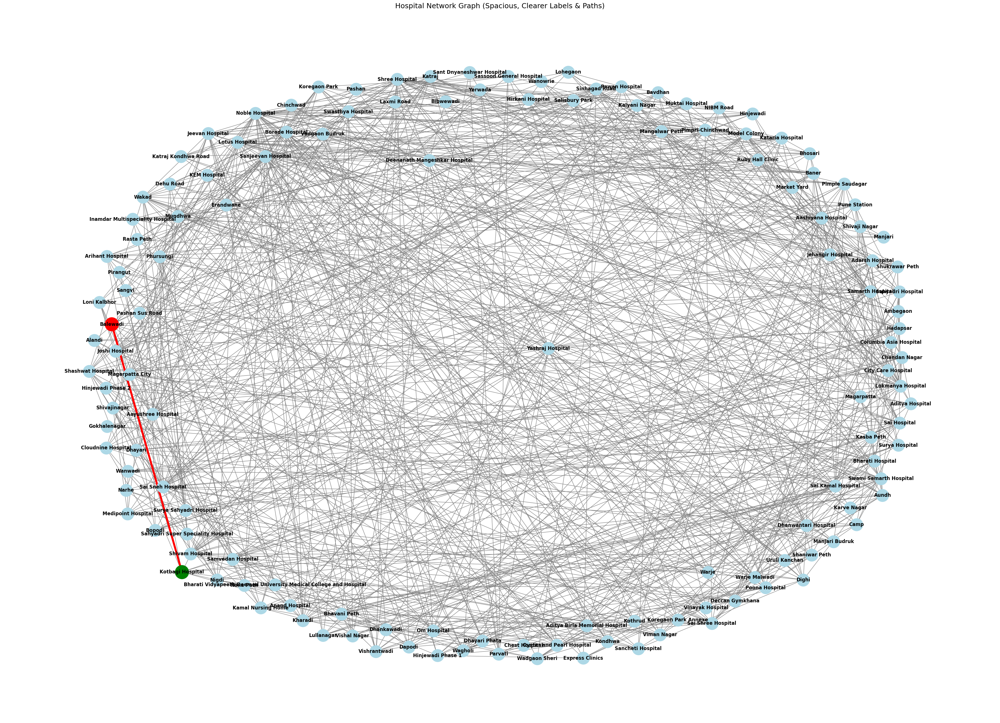

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd

# ✅ Ensure inline plotting in Colab
%matplotlib inline

# ✅ Load dataset
df = pd.read_csv("Hospitals_in_Pune_dataset.csv")

# ✅ Construct graph
graph = nx.Graph()
for index, row in df.iterrows():
    src = row["Location_of_Patient"]
    dst = row["Final_Destination_Nearest_Hospital"]
    weight = row["Distance_km"] / row["Traffic_Level_Percentage"]  # Adjusted weight
    graph.add_edge(src, dst, weight=round(weight, 2))

# ✅ Define Dijkstra's Algorithm
def dijkstra(graph, start, end):
    import heapq
    queue = [(0, start, [])]
    visited = set()
    while queue:
        (cost, node, path) = heapq.heappop(queue)
        if node in visited:
            continue
        path = path + [node]
        if node == end:
            return cost, path
        visited.add(node)
        for neighbor in graph.neighbors(node):
            weight = graph[node][neighbor]["weight"]
            heapq.heappush(queue, (cost + weight, neighbor, path))
    return None, []

# ✅ Get user input
initial_location = input("Enter your location: ")
if initial_location not in graph:
    print("❌ Location not found in dataset.")
else:
    # Find nearest hospital using Dijkstra
    nearest_hospital, min_distance, shortest_path = None, float('inf'), []
    for hospital in graph.nodes():
        if hospital == initial_location:
            continue
        distance, path = dijkstra(graph, initial_location, hospital)
        if distance is not None and distance < min_distance:
            nearest_hospital, min_distance, shortest_path = hospital, distance, path

    # ✅ Display shortest path details in text
    print(f"🏥 Nearest Hospital: {nearest_hospital}")
    print(f"📏 Distance: {round(min_distance, 2)} km")
    print(f"🛤️ Shortest Path: {' → '.join(shortest_path)}")

#     # ✅ Draw the graph in Colab
# plt.figure(figsize=(25, 15))  # ⬆️ Increased figure size

# # ⬆️ Adjusted layout for better spacing
# pos = nx.spring_layout(graph, seed=42, k=1.5)  # Increase 'k' for more spacing

# # ✅ Draw all nodes
# nx.draw(graph, pos, with_labels=True, node_size=600, node_color="lightblue", font_size=10, font_weight="bold")

# # ✅ Highlight the shortest path in red
# path_edges = list(zip(shortest_path, shortest_path[1:]))
# nx.draw_networkx_edges(graph, pos, edgelist=path_edges, edge_color="red", width=3)

# # ✅ Highlight start (red) and hospital (green)
# nx.draw_networkx_nodes(graph, pos, nodelist=[shortest_path[0]], node_color="red", node_size=900, label="Start")
# nx.draw_networkx_nodes(graph, pos, nodelist=[shortest_path[-1]], node_color="green", node_size=900, label="Nearest Hospital")

# plt.title("Hospital Network Graph (More Spacing, Shortest Path in Red)", fontsize=16)
# plt.show()



import networkx as nx
import matplotlib.pyplot as plt

plt.figure(figsize=(35, 25))  # ⬆️ Increase figure size for better spacing

# ⬆️ Adjust spring layout for better spacing and clarity
pos = nx.spring_layout(graph, seed=42, k=2.5)  # Increase 'k' to spread nodes more

# ✅ Draw all nodes with bigger font size
nx.draw(graph, pos, with_labels=True, node_size=1000, node_color="lightblue", font_size=12, font_weight="bold", edge_color="gray")

# ✅ Highlight the shortest path in red with thicker lines
path_edges = list(zip(shortest_path, shortest_path[1:]))
nx.draw_networkx_edges(graph, pos, edgelist=path_edges, edge_color="red", width=5)

# ✅ Highlight start (red) and hospital (green) with bigger sizes
nx.draw_networkx_nodes(graph, pos, nodelist=[shortest_path[0]], node_color="red", node_size=1200, label="Start")
nx.draw_networkx_nodes(graph, pos, nodelist=[shortest_path[-1]], node_color="green", node_size=1200, label="Nearest Hospital")

plt.title("Hospital Network Graph (Spacious, Clearer Labels & Paths)", fontsize=18)
plt.show()


Enter your location: Wakad
🏥 Nearest Hospital: Samvedan Hospital
📏 Distance: 0.14 km
🛤️ Shortest Path: Wakad → Samvedan Hospital


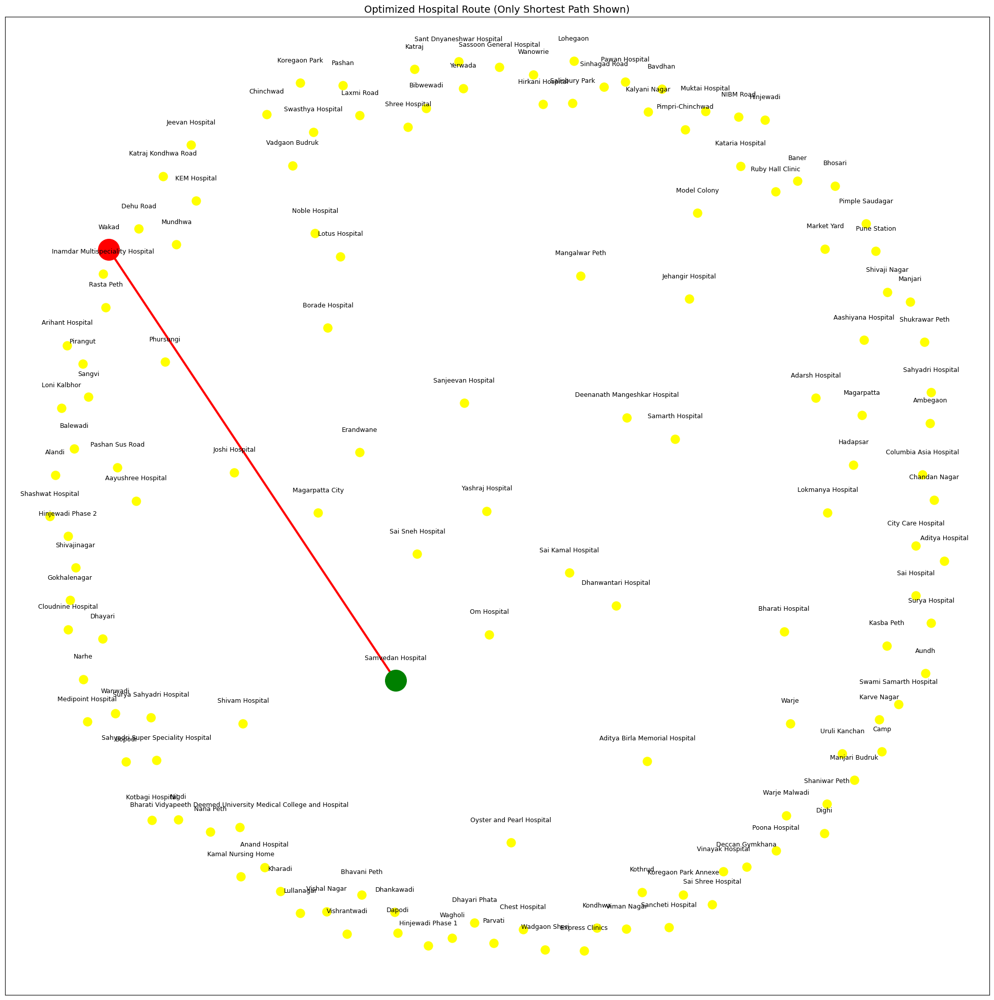

In [4]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd

# ✅ Load dataset
df = pd.read_csv("Hospitals_in_Pune_dataset.csv")

# ✅ Construct graph
graph = nx.Graph()
for index, row in df.iterrows():
    src = row["Location_of_Patient"]
    dst = row["Final_Destination_Nearest_Hospital"]
    weight = row["Distance_km"] / row["Traffic_Level_Percentage"]
    graph.add_edge(src, dst, weight=round(weight, 2))

# ✅ Dijkstra's Algorithm to find the shortest path
def dijkstra(graph, start, end):
    import heapq
    queue = [(0, start, [])]
    visited = set()
    while queue:
        (cost, node, path) = heapq.heappop(queue)
        if node in visited:
            continue
        path = path + [node]
        if node == end:
            return cost, path
        visited.add(node)
        for neighbor in graph.neighbors(node):
            weight = graph[node][neighbor]["weight"]
            heapq.heappush(queue, (cost + weight, neighbor, path))
    return None, []

# ✅ Get user input
initial_location = input("Enter your location: ")
if initial_location not in graph:
    print("❌ Location not found in dataset.")
else:
    # Find nearest hospital using Dijkstra
    nearest_hospital, min_distance, shortest_path = None, float('inf'), []
    for hospital in graph.nodes():
        if hospital == initial_location:
            continue
        distance, path = dijkstra(graph, initial_location, hospital)
        if distance is not None and distance < min_distance:
            nearest_hospital, min_distance, shortest_path = hospital, distance, path

    # ✅ Display shortest path details
    print(f"🏥 Nearest Hospital: {nearest_hospital}")
    print(f"📏 Distance: {round(min_distance, 2)} km")
    print(f"🛤️ Shortest Path: {' → '.join(shortest_path)}")

    # ✅ Draw only the nodes with clear names
    plt.figure(figsize=(25, 25))
    pos = nx.spring_layout(graph, seed=42, k=1.5)

    # ✅ Adjust label positions by shifting them
    label_pos = {node: (x, y + 0.05) for node, (x, y) in pos.items()}  # Shift text upwards

    # ✅ Draw all nodes (locations and hospitals)
    nx.draw_networkx_nodes(graph, pos, node_size=150, node_color="yellow")
    nx.draw_networkx_labels(graph, label_pos, font_size=9, font_weight="normal")  # Adjusted positions

    # ✅ Draw only the shortest path
    path_edges = list(zip(shortest_path, shortest_path[1:]))
    nx.draw_networkx_edges(graph, pos, edgelist=path_edges, edge_color="red", width=3)

    # ✅ Highlight start (red) and hospital (green)
    nx.draw_networkx_nodes(graph, pos, nodelist=[shortest_path[0]], node_color="red", node_size=900, label="Start")
    nx.draw_networkx_nodes(graph, pos, nodelist=[shortest_path[-1]], node_color="green", node_size=900, label="Nearest Hospital")

    plt.title("Optimized Hospital Route (Only Shortest Path Shown)", fontsize=14)
    plt.show()
